In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

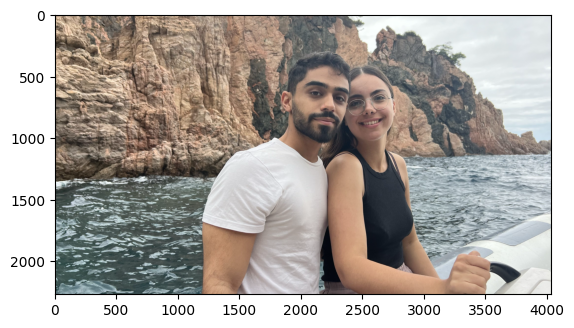

In [2]:
img = cv2.imread('image.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

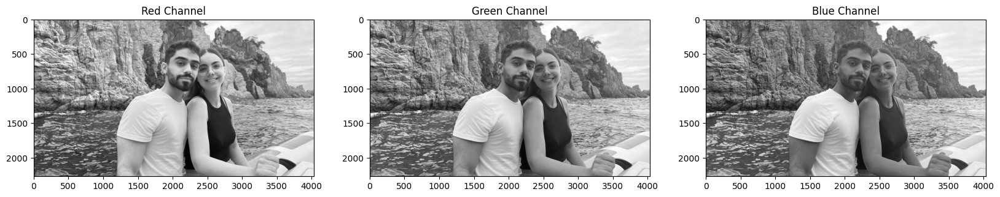

In [3]:
red_channel = img[:,:,0]
green_channel = img[:,:,1]
blue_channel = img[:,:,2]
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(red_channel, cmap='gray')
plt.title('Red Channel')
plt.subplot(1,3,2)
plt.imshow(green_channel, cmap='gray')
plt.title('Green Channel')
plt.subplot(1,3,3)  
plt.imshow(blue_channel, cmap='gray')   
plt.title('Blue Channel')
plt.show()

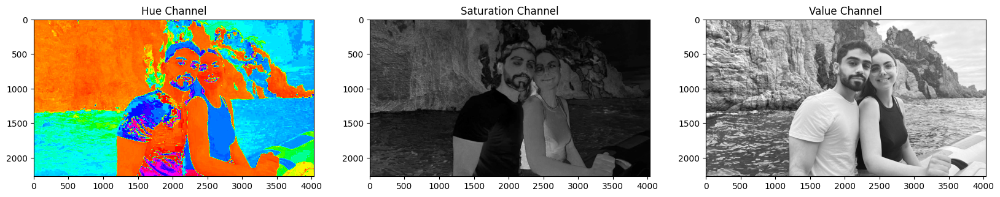

In [4]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
h_channel = img_hsv[:,:,0]
s_channel = img_hsv[:,:,1]
v_channel = img_hsv[:,:,2]
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(h_channel, cmap='hsv')
plt.title('Hue Channel')
plt.subplot(1,3,2)
plt.imshow(s_channel, cmap='gray')
plt.title('Saturation Channel')
plt.subplot(1,3,3)
plt.imshow(v_channel, cmap='gray')
plt.title('Value Channel')
plt.show()

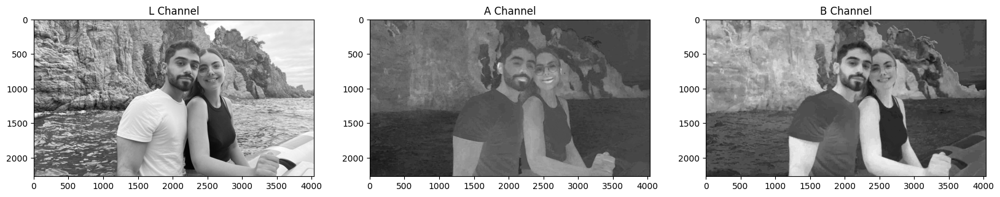

In [5]:
lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
l_channel = lab_img[:,:,0]
a_channel = lab_img[:,:,1]
b_channel = lab_img[:,:,2]
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(l_channel, cmap='gray')
plt.title('L Channel')
plt.subplot(1,3,2)
plt.imshow(a_channel, cmap='gray')
plt.title('A Channel')
plt.subplot(1,3,3)
plt.imshow(b_channel, cmap='gray')
plt.title('B Channel')
plt.show()

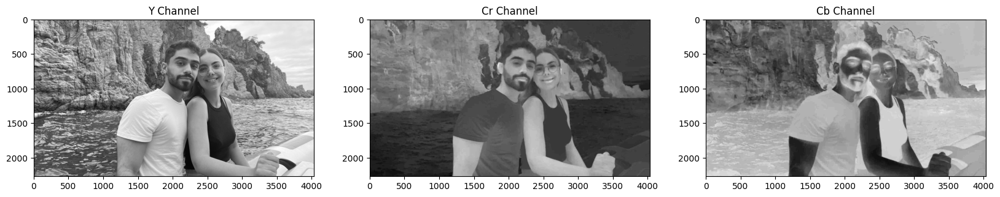

In [6]:
ycbcr_img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
y_channel = ycbcr_img[:,:,0]
cr_channel = ycbcr_img[:,:,1]
cb_channel = ycbcr_img[:,:,2]
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(y_channel, cmap='gray')
plt.title('Y Channel')
plt.subplot(1,3,2)
plt.imshow(cr_channel, cmap='gray')
plt.title('Cr Channel')
plt.subplot(1,3,3)
plt.imshow(cb_channel, cmap='gray')
plt.title('Cb Channel')
plt.show()

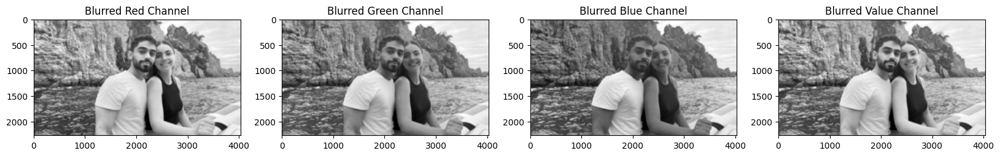

In [7]:
blurred_red = cv2.GaussianBlur(red_channel, (31, 31), 10)
blurred_green = cv2.GaussianBlur(green_channel, (31, 31), 10)
blurred_blue = cv2.GaussianBlur(blue_channel, (31, 31), 10)
blurred_value = cv2.GaussianBlur(v_channel, (31, 31), 10)
plt.figure(figsize=(20,10))
plt.subplot(1,4,1)
plt.imshow(blurred_red, cmap='gray')
plt.title('Blurred Red Channel')
plt.subplot(1,4,2)
plt.imshow(blurred_green, cmap='gray')
plt.title('Blurred Green Channel')
plt.subplot(1,4,3)
plt.imshow(blurred_blue, cmap='gray')
plt.title('Blurred Blue Channel')
plt.subplot(1,4,4)
plt.imshow(blurred_value, cmap='gray')
plt.title('Blurred Value Channel')
plt.show()

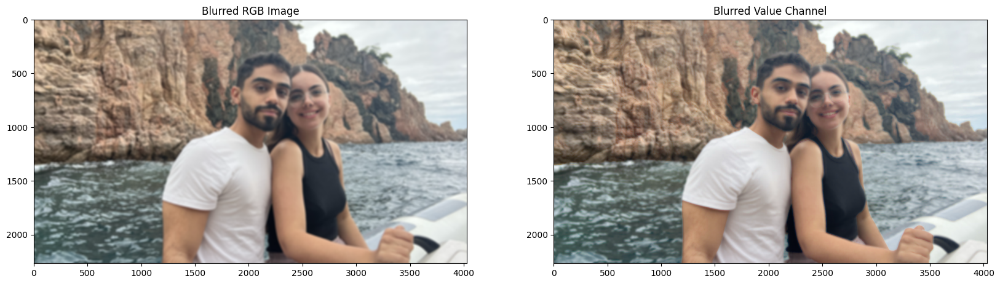

In [8]:
rgb_blurred = cv2.merge([blurred_red, blurred_green, blurred_blue])
hsv_blurred = cv2.merge([h_channel, s_channel, blurred_value])
hsv_to_plot = cv2.cvtColor(hsv_blurred, cv2.COLOR_HSV2RGB)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(rgb_blurred)
plt.title('Blurred RGB Image')
plt.subplot(1,2,2)
plt.imshow(hsv_to_plot)
plt.title('Blurred Value Channel')
plt.show()

## CLAHE

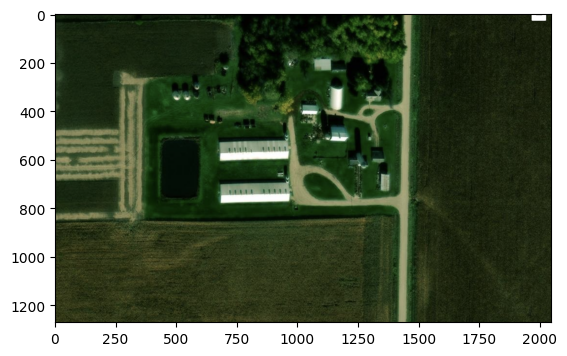

In [9]:
satellites_img = cv2.imread('satellites.png')
satellites_img = cv2.cvtColor(satellites_img, cv2.COLOR_BGR2RGB)
plt.imshow(satellites_img)
plt.show()

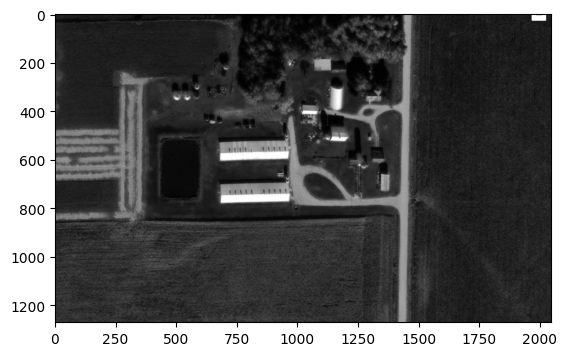

In [10]:
grayscale = cv2.cvtColor(satellites_img, cv2.COLOR_RGB2GRAY)
plt.imshow(grayscale, cmap='gray')
plt.show()

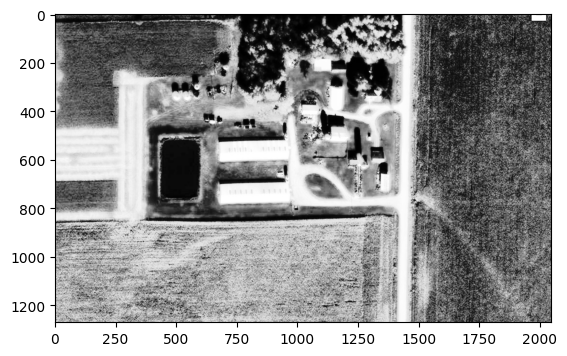

In [11]:
eh = cv2.equalizeHist(grayscale)
plt.imshow(eh, cmap='gray')
plt.show()

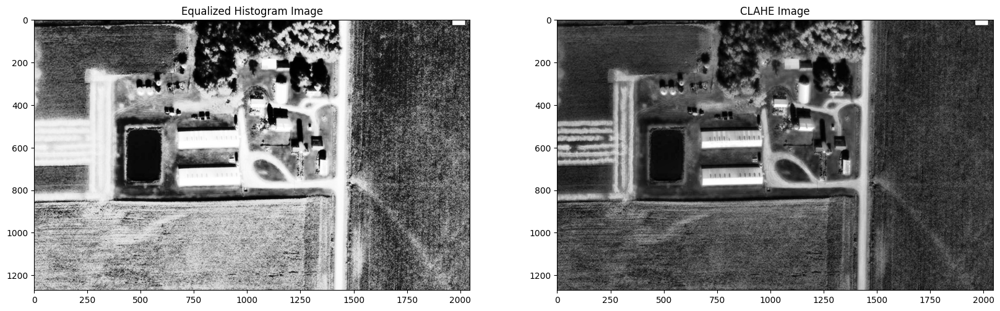

In [12]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl = clahe.apply(grayscale)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(eh, cmap='gray')
plt.title('Equalized Histogram Image')
plt.subplot(1,2,2)
plt.imshow(cl, cmap='gray')
plt.title('CLAHE Image')
plt.show()


## SIFT

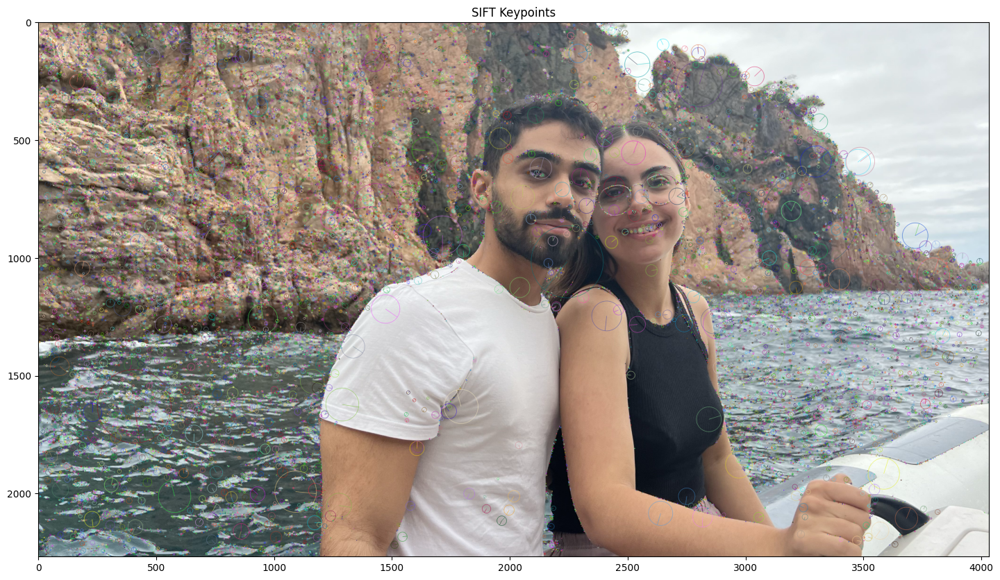

In [38]:
# Initialize the SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints, descriptors = sift.detectAndCompute(img, None)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with keypoints
plt.figure(figsize=(20,10))
plt.imshow(img_with_keypoints)
plt.title('SIFT Keypoints')
plt.show()

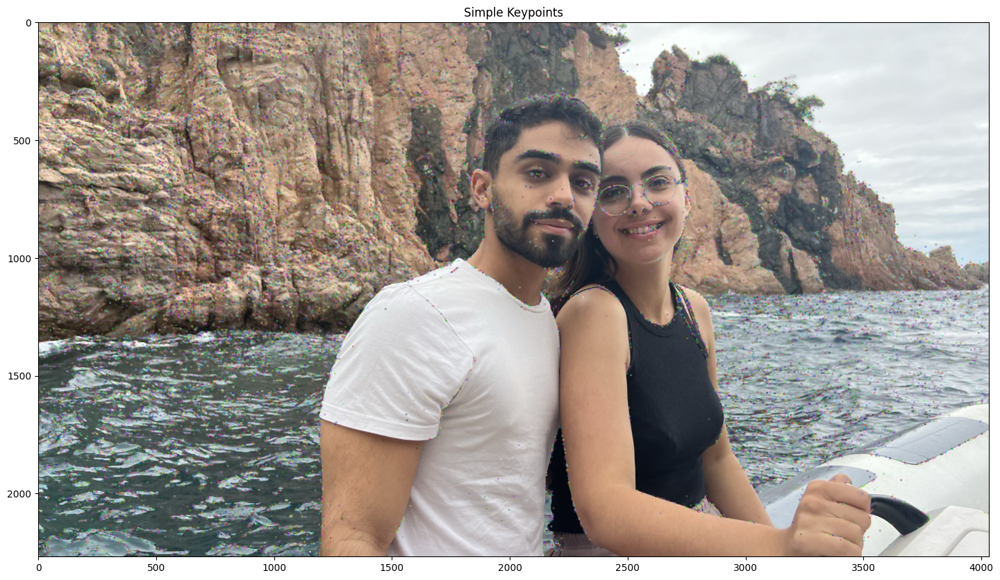

In [39]:
img_with_simple_keypoints = cv2.drawKeypoints(img, keypoints, None)
plt.figure(figsize=(20,10))
plt.imshow(img_with_simple_keypoints)
plt.title('Simple Keypoints')
plt.show()

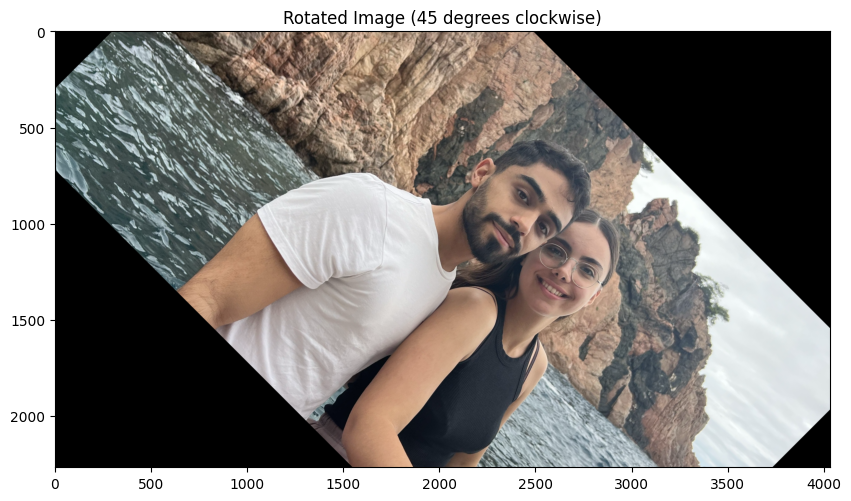

In [40]:
(h, w) = img.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, -45, 1.0)
rotated_img = cv2.warpAffine(img, M, (w, h))
plt.figure(figsize=(10, 10))
plt.imshow(rotated_img)
plt.title('Rotated Image (45 degrees clockwise)')
plt.show()

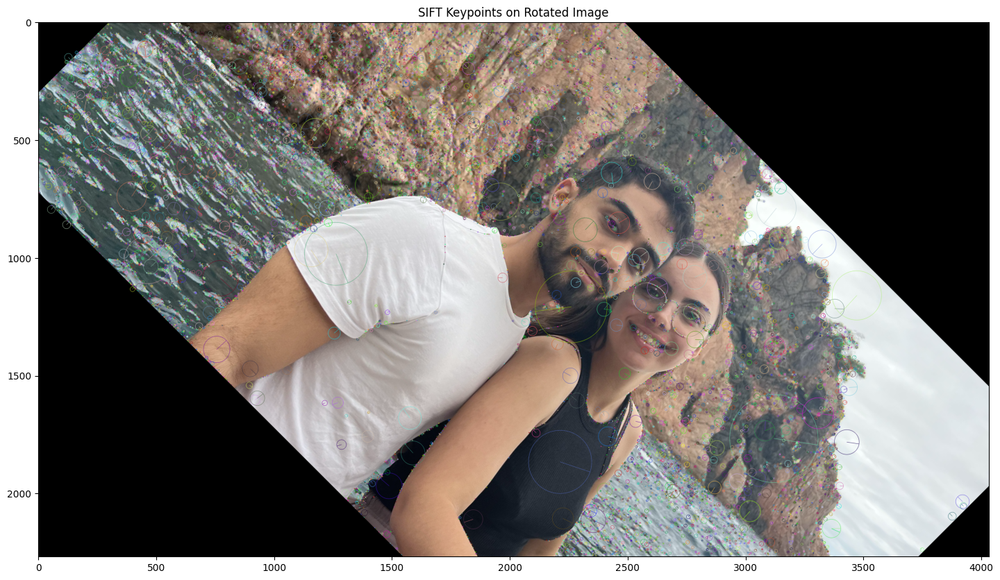

In [41]:
keypoints2, descriptors2 = sift.detectAndCompute(rotated_img, None)
rotated_img_with_keypoints = cv2.drawKeypoints(rotated_img, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(20,10))
plt.imshow(rotated_img_with_keypoints)
plt.title('SIFT Keypoints on Rotated Image')
plt.show()

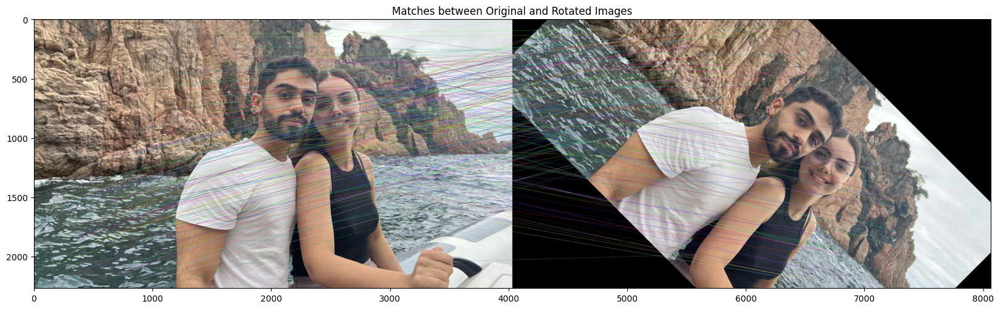

In [42]:
# Initialize the BFMatcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Find matches between the original and rotated images
matches = bf.match(descriptors, descriptors2)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 50 matches
img_matches = cv2.drawMatches(img, keypoints, rotated_img, keypoints2, matches[:200], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
plt.figure(figsize=(20, 10))
plt.imshow(img_matches)
plt.title('Matches between Original and Rotated Images')
plt.show()